## PROJECT OVERVIEW

Accodring to water.org, out of its population of 59 million people, 16 million Tanzanian people (28% of the population) lack access to safe water, and 44 million people (73%) lack access to safely managed household sanitation facilities. For millions of Tanzanians, ensuring access to clean water is an urgent concern of public health and wellbeing, not just convenience.

This project seeks to use machine learning classification models to address this urgent issue. It is motivated by two goals: first, to learn more about the challenges and barriers encountered during Tanzania's well-drilling procedures; and second, to develop workable, data-driven solutions that may be applied to address this pressing problem.

In addition to offering a thorough grasp of the issue, the knowledge gathered from this analysis will act as the basis for developing workable and efficient solutions.

In the end, through increasing access to clean water, this initiative has the potential to have a major effect on Tanzanian individuals' lives. Additionally, it supports the primary objective of tackling the more significant worldwide issue of ensuring everyone has access to clean water and sanitary facilities. In order to accomplish the project's objectives and significantly improve the lives of the people impacted, collaboration with non-governmental organisations, local government agencies, and professionals in the field will be essential.

The data used for this project is from the Driven Data website https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/


## Data Cleaning

**COLUMN DESCRIPTION**
- amount_tsh - Total static head (amount water available to waterpoint)
- gps_height - Altitude of the well
- installer - Organization that installed the well
- longitude - GPS coordinate
- latitude - GPS coordinate
- basin - Geographic water basin
- subvillage - Geographic location
- region - Geographic location
- region_code - Geographic location (coded)
- district_code - Geographic location (coded)
- lga - Geographic location
- ward - Geographic location
- population - Population around the well
- public_meeting - True/False
- recorded_by - Group entering this row of data
- scheme_management - Who operates the waterpoint
- scheme_name - Who operates the waterpoint
- permit - If the waterpoint is permitted
- construction_year - Year the waterpoint was constructed
- extraction_type - The kind of extraction the waterpoint uses
- management - How the waterpoint is managed
- management_group - How the waterpoint is managed
- payment_type - What the water costs
- water_quality - The quality of the water
- quantity - The quantity of water
- source - The source of the water
- waterpoint_type - The kind of waterpoint


In [1]:
#import the necessary libraries

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#load data
training_data = pd.read_csv('data/training_set_values.csv' , index_col = 0)
training_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 69572 to 26348
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             59400 non-null  float64
 1   date_recorded          59400 non-null  object 
 2   funder                 55765 non-null  object 
 3   gps_height             59400 non-null  int64  
 4   installer              55745 non-null  object 
 5   longitude              59400 non-null  float64
 6   latitude               59400 non-null  float64
 7   wpt_name               59400 non-null  object 
 8   num_private            59400 non-null  int64  
 9   basin                  59400 non-null  object 
 10  subvillage             59029 non-null  object 
 11  region                 59400 non-null  object 
 12  region_code            59400 non-null  int64  
 13  district_code          59400 non-null  int64  
 14  lga                    59400 non-null  object 
 15

In [3]:
training_data.sample(5)

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
id,,,,,,,,,,,,,,,,,,,,,
63692,0.0,2011-07-21,Concern World Wide,0,DWE,31.478226,-2.792355e+00,Chemamba,0,Lake Tanganyika,...,never pay,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump
44311,12000.0,2013-02-25,Japan,1049,DWE,35.360726,-9.914684e+00,Kwa Regnady,0,Lake Nyasa,...,annually,soft,good,dry,dry,river,river/lake,surface,communal standpipe,communal standpipe
40703,0.0,2013-01-30,Lwi,0,LWI,0.000000,-2.000000e-08,Pamba,0,Lake Victoria,...,other,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump
58154,0.0,2012-11-30,Baric,1314,Baric,34.517492,-1.465359e+00,Kwa Habiha Wambura,0,Lake Victoria,...,unknown,salty,salty,enough,enough,river,river/lake,surface,communal standpipe multiple,communal standpipe
49365,0.0,2011-03-29,Government Of Tanzania,0,Government,33.451132,-8.567917e+00,Mwanjelile,0,Lake Rukwa,...,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe


In [4]:
training_data.shape

(59400, 39)

In [5]:
labels = pd.read_csv('data/training_set_labels.csv' , index_col= 0)
labels.head()

,status_group
id,
69572,functional
8776,functional
34310,functional
67743,non functional
19728,functional


In [6]:
#join training set and the training set labels
training_set_data = labels.merge(training_data, on = 'id').reset_index()
training_set_data.sample(5)

,id,status_group,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
45493,63278,non functional,0.0,2011-04-15,NaN,0,NaN,33.862270,-8.670783,Kwa Mzee Juma Mdeda,...,never pay,soft,good,seasonal,seasonal,river,river/lake,surface,communal standpipe,communal standpipe
48154,15619,functional,0.0,2013-02-01,World Vision,0,SEMA,33.058443,-4.831641,Kipendaroho,...,never pay,soft,good,seasonal,seasonal,shallow well,shallow well,groundwater,hand pump,hand pump
13519,19017,functional,2400.0,2013-02-22,Snv,609,DWE,36.431744,-11.402340,Shuleni,...,annually,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump
45981,1302,functional,0.0,2011-07-20,Morovian Church,0,morovian church,33.737594,-9.565292,Morovian Church,...,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
50620,11719,functional,7.0,2013-11-03,Germany Republi,1529,CES,37.226026,-3.202510,Nkwarumbe English Medium,...,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe multiple,communal standpipe


In [7]:
# look for null values
(training_set_data.isna().sum() / len(training_set_data) * 100).sort_values(ascending=False)


scheme_name              47.417508
scheme_management         6.526936
installer                 6.153199
funder                    6.119529
public_meeting            5.612795
permit                    5.144781
subvillage                0.624579
basin                     0.000000
lga                       0.000000
district_code             0.000000
region_code               0.000000
region                    0.000000
waterpoint_type_group     0.000000
ward                      0.000000
wpt_name                  0.000000
latitude                  0.000000
longitude                 0.000000
gps_height                0.000000
date_recorded             0.000000
amount_tsh                0.000000
status_group              0.000000
num_private               0.000000
recorded_by               0.000000
population                0.000000
waterpoint_type           0.000000
source_class              0.000000
source_type               0.000000
source                    0.000000
quantity_group      

In [8]:
#  In this particular analysis the scheme_name and scheme_management is not important so we will drop it
training_set_data.drop(columns=[ 'scheme_name' , 'scheme_management'], inplace= True)

In [9]:
# Close look at the public_meeting column
missing_values = training_set_data['public_meeting'].isna().sum()
unique_values = training_set_data['public_meeting'].value_counts()
missing_values, unique_values

(3334,
 True     51011
 False     5055
 Name: public_meeting, dtype: int64)

In [10]:
"""Because the public meeting column might be important, we will replace the null values with an 'unknown' placeholder because there is
no way to know whether the place was a public meeting place or not"""

training_set_data['public_meeting'].fillna('unknown' , inplace = True)
null = training_set_data['public_meeting'].isna().sum() 
counts = training_set_data.public_meeting.value_counts()

null, counts

(0,
 True       51011
 False       5055
 unknown     3334
 Name: public_meeting, dtype: int64)

<span style="color: maroon">Fill installer null values</span>

In [11]:
# lets take a closer look at the installer feature
training_set_data['installer'] = training_set_data['installer'].str.strip()
null_values = training_set_data.installer.isna().sum()
count = training_set_data.installer.value_counts()
nun = (training_set_data['installer'] == 0).any()
null_values , nun , count 

(3655,
 False,
 DWE                            17402
 Government                      1825
 RWE                             1206
 Commu                           1060
 DANIDA                          1050
                                ...  
 Nyeisa                             1
 Mbozi Hospital                     1
 Magani                             1
 Rural Drinkung Water Supply        1
 Hamis Makombo                      1
 Name: installer, Length: 2145, dtype: int64)

In [12]:
"""The query is conditioned to show installers from the specified regions. The output is an indication that installers could have been specified
to a particular region. We could use the installers in similar regions to fill in the null values in our installer feature"""
from pandasql import sqldf

query1 = """SELECT installer , region, COUNT(DISTINCT region) AS region_count 
            FROM training_set_data
            WHERE region IN ( 'Lindi' , 'Manyara' , 'Mtwara')
            GROUP BY region"""
pysqldf = sqldf(query1)
result = pysqldf
result

,installer,region,region_count
0,Kilolo Star,Lindi,1
1,World vision,Manyara,1
2,UNICEF,Mtwara,1


In [13]:
"""fill missing values in the 'installer' column with the mode installer of similar regions"""

# import  library
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# encode region column
training_set_data['region_encoded'] = label_encoder.fit_transform(training_set_data['region'])

column = 'installer'

# Find  mode installer in encoded region
reference = training_set_data.groupby('region_encoded')[column].transform(lambda x: x.mode().iloc[0])

# Fill missing installer values with mode installers from similar regions
training_set_data[column] = training_set_data[column].fillna(reference)

In [14]:
# revert to categorical data
region = label_encoder.inverse_transform(training_set_data['region_encoded'])

training_set_data['region'] = region

In [15]:
# Assert filling
training_set_data.installer.isna().sum()

0

Fill null funder values

In [16]:
#lets have a closer look at the funder column
training_set_data['funder'].str.strip() # strip special characters

funder_count = training_set_data['funder'].value_counts() # value count

funder_missing = training_set_data['funder'].isna().sum() # null values

funder_nun = (training_set_data['funder'] == 0).any() # 0 to represent a null value

funder_missing,funder_count,funder_nun


(3635,
 Government Of Tanzania    9084
 Danida                    3114
 Hesawa                    2202
 Rwssp                     1374
 World Bank                1349
                           ... 
 Lungwe                       1
 M                            1
 Motiba Manyanya              1
 Toronto-estate               1
 Kibara Foundation            1
 Name: funder, Length: 1897, dtype: int64,
 False)

In [17]:
training_set_data.region.value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

In [18]:
query2 = """SELECT funder , region , COUNT(DISTINCT funder) AS funder_count FROM training_set_data
            GROUP BY region"""
pysqldf = sqldf(query2)
result = pysqldf
result

,funder,region,funder_count
0,Not Known,Arusha,174
1,0,Dar es Salaam,1
2,Water,Dodoma,78
3,Roman,Iringa,131
4,Action In A,Kagera,122
5,African Development Bank,Kigoma,114
6,Lawatefuka Water Supply,Kilimanjaro,134
7,Sobodo,Lindi,71
8,Lottery Club,Manyara,113
9,Grumeti,Mara,238


In [19]:
# Check if there is another region that has 0 as a funder
zero_funder = training_set_data.loc[training_set_data['funder'] == '0']
zero_regions = zero_funder['region'].unique()
zero_regions


array(['Dar es Salaam'], dtype=object)

In [20]:
"""replace '0' with an unknown placeholder. This is because 0 could stand for no funder or there was a funder, but they were not recorded ,
so unknown is a good stand-in for both"""

training_set_data.replace('0' , 'unknown' , inplace = True)

In [21]:
# assert replacement
zero_funder = training_set_data.loc[training_set_data['funder'] == '0']
zero_regions = zero_funder['region'].unique()
zero_regions


array([], dtype=object)

In [22]:
# check correlation between funder and region
import scipy.stats as stats

table = pd.crosstab(training_set_data['funder'], training_set_data['region'])

# Perform a chi-squared test
chi2, p, _, _ = stats.chi2_contingency(table)

# Check the p-value
if p < 0.05:
    print("Association")
else:
    print("No association.")

Association


In [23]:
"""From our test , there is statistically a correlation between the region and the funder choice, and the two are not independent.
Therefore we will use the mode funder values from similar regions to fill the null values"""


# Initialize LabelEncoder
label_encoder = LabelEncoder()

# encode region column
training_set_data['region_encoded'] = label_encoder.fit_transform(training_set_data['region'])

column= 'funder'

# Find the mode funder in similar regions
reference = training_set_data.groupby('region_encoded')[column].transform(lambda x: x.mode().iloc[0])

# Fill null values in funder column with mode funder from similar regions
training_set_data[column] = training_set_data[column].fillna(reference)

In [24]:
# assert fillna
training_set_data.funder.isna().sum()

0

In [25]:
# revert to categorical data
region = label_encoder.inverse_transform(training_set_data['region_encoded'])

training_set_data['region'] = region

In [26]:
# closer look at the permit column
count = training_set_data['permit'].value_counts() # value count

null = training_set_data['permit'].isna().sum() # null values
null , count


(3056,
 True     38852
 False    17492
 Name: permit, dtype: int64)

In [27]:
"""filling the null permit values with unknown because our assumption is the null values could be either true or false.
 Its hard to impute the permit column using values from similar records"""

training_set_data['permit'].fillna('unknown', inplace = True)

#assert replacement
training_set_data['permit'].isna().any()

False

In [28]:
# closer look at the sub_village column

training_set_data['subvillage'].str.strip()

subvillage_count = training_set_data.subvillage.value_counts() # value count

subvillage_nan = (training_set_data.subvillage == 'nan').any() # null values that could be filled with nan

subvillage_null= training_set_data['subvillage'].isna().sum() # null values

subvillage_nan, subvillage_null, subvillage_count


(False,
 371,
 Madukani          508
 Shuleni           506
 Majengo           502
 Kati              373
 Mtakuja           262
                  ... 
 Mpujini             1
 Kirimbochoni        1
 Mtandula            1
 Sima Ya Zamani      1
 Ivugula Juu         1
 Name: subvillage, Length: 19287, dtype: int64)

In [29]:
# drop subvillage column as it wont be important in our analysis
training_set_data.drop(columns = 'subvillage' , inplace = True)


In [30]:
# Assert that there are no more null values
(training_set_data.isna().sum() / len(training_set_data) * 100).sort_values(ascending=False)


region_encoded           0.0
wpt_name                 0.0
ward                     0.0
lga                      0.0
district_code            0.0
region_code              0.0
region                   0.0
basin                    0.0
num_private              0.0
latitude                 0.0
public_meeting           0.0
longitude                0.0
installer                0.0
gps_height               0.0
funder                   0.0
date_recorded            0.0
amount_tsh               0.0
status_group             0.0
population               0.0
recorded_by              0.0
waterpoint_type_group    0.0
water_quality            0.0
waterpoint_type          0.0
source_class             0.0
source_type              0.0
source                   0.0
quantity_group           0.0
quantity                 0.0
quality_group            0.0
payment_type             0.0
permit                   0.0
payment                  0.0
management_group         0.0
management               0.0
extraction_typ

In [31]:
training_set_data.construction_year.value_counts()

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

In [32]:
"""Construction year has a lot of 0 values. We will drop the construction year feature as its not important in our analysis"""
# drop construction year column
training_set_data.drop('construction_year' , axis = 1,  inplace= True) 

In [33]:
# check for other columns that might have 0 as a row entry
columns_with_zero_entries = []
for column in training_set_data.columns:
    if (training_set_data[column] == 0).any():
        columns_with_zero_entries.append(column)

print(columns_with_zero_entries)


['id', 'amount_tsh', 'gps_height', 'longitude', 'num_private', 'district_code', 'population', 'public_meeting', 'permit', 'region_encoded']


In [34]:
"""Amount_tsh refers to the total static head which is  the height that water has to travel as it moves through your discharge pipe.
Having a static head of 0 is normal"""

training_set_data['amount_tsh'].value_counts(normalize=True)

0.0         0.700993
500.0       0.052222
50.0        0.041616
1000.0      0.025051
20.0        0.024630
              ...   
8500.0      0.000017
6300.0      0.000017
220.0       0.000017
138000.0    0.000017
12.0        0.000017
Name: amount_tsh, Length: 98, dtype: float64

In [35]:
"""GPS_height refers to the altitude of the well. Having a gps height of 0 could mean that the well
    is located at or very close to the sea level.
    A gps height of 0 could be determined by the well's location """

training_set_data['gps_height'].value_counts(normalize = True)

 0       0.344074
-15      0.001010
-16      0.000926
-13      0.000926
-20      0.000875
           ...   
 2285    0.000017
 2424    0.000017
 2552    0.000017
 2413    0.000017
 2385    0.000017
Name: gps_height, Length: 2428, dtype: float64

In [36]:
#closer look at longitute feature
"""We notice that there are 1812 points with 0 longitude matching exactly with -2e-8 latitude
A longitude of 0.0000 is not viable in tanzania due to its geographical location"""

training_set_data[['longitude', 'latitude']].value_counts()



longitude  latitude     
0.000000   -2.000000e-08    1812
32.987670  -2.490324e+00       2
37.274352  -7.102004e+00       2
37.534327  -6.964258e+00       2
37.339811  -7.065373e+00       2
                            ... 
36.697381  -2.733935e+00       1
36.697309  -8.092875e+00       1
36.697063  -8.110059e+00       1
36.697013  -3.350101e+00       1
35.004687  -9.265576e+00       1
Length: 57520, dtype: int64

In [37]:
# check the percentage of this values

"""only 3.05% of the coordinates have 0.000 longitude. so we will drop all the 0.000 longitutde values"""
(len(training_set_data[training_set_data['longitude'] == 0])/ len(training_set_data)) * 100

3.05050505050505

In [38]:
# Drop rows with 0 longitude
training_set_data = training_set_data.loc[training_set_data['longitude'] != 0]

In [39]:
#assert drop
""" There is no -0.0000 latitude """

(training_set_data['latitude'] == -0.000).any()

False

In [40]:
# closer look at the num_private column
training_set_data.num_private.value_counts()

0      56831
6         81
1         73
5         46
8         46
       ...  
180        1
213        1
23         1
55         1
94         1
Name: num_private, Length: 65, dtype: int64

In [41]:
# drop column as its not useful in our analysis
training_set_data.drop('num_private' , axis = 1 , inplace = True)


In [42]:
# closer look at the district code column
training_set_data.district_code.value_counts()

1     11146
2     10909
3      9998
4      8996
5      4356
6      3586
7      3343
8      1043
30      995
33      874
53      745
43      505
13      391
23      293
63      195
62      109
60       63
0        23
80       12
67        6
Name: district_code, dtype: int64

In [43]:
# normally a district code of 0 is not valid but in this case i will not be making use of the district code feature 
training_set_data.drop(columns = 'district_code' ,inplace = True)

In [44]:
"""Having a population of 0 around the well is very plausible."""
training_set_data.population.value_counts(normalize = True)

# The population around a well can be 0

0       0.339810
1       0.121987
200     0.033688
150     0.032854
250     0.029190
          ...   
3241    0.000017
1960    0.000017
1685    0.000017
2248    0.000017
1439    0.000017
Name: population, Length: 1049, dtype: float64

In [45]:
# closer look at status group
training_set_data['status_group'].value_counts()

functional                 31389
non functional             22268
functional needs repair     3931
Name: status_group, dtype: int64

In [46]:
# check columns with nan entries
columns_with_nan_entries = []

for column in training_set_data.columns:
    if (training_set_data[column] == 'nun').any():
        columns_with_zero_entries.append(column)

print(columns_with_nan_entries)

[]


In [47]:
"""We will leave the 'unknown' and 'other' entries as is because the water sources for the well being 'unknown' is very possible
and the water sources could be unexplainable hence the unknown tag"""

#closer look at the source column
training_set_data['source'].value_counts().sort_values(ascending=False)


spring                  17006
shallow well            15499
machine dbh             10826
river                    9612
rainwater harvesting     2218
hand dtw                  873
dam                       649
lake                      639
other                     202
unknown                    64
Name: source, dtype: int64

In [48]:
# closer look at the source_type class
training_set_data['source_type'].value_counts()

spring                  17006
shallow well            15499
borehole                11699
river/lake              10251
rainwater harvesting     2218
dam                       649
other                     266
Name: source_type, dtype: int64

In [49]:
# closer look at the source_class feature
training_set_data['source_class'].value_counts()

groundwater    44204
surface        13118
unknown          266
Name: source_class, dtype: int64

In [50]:
# dropping source type and class due to duplication of information
training_set_data.drop(columns = ['source_class' , 'source_type'],  inplace = True)

In [51]:
"""We will leave the water quality unknown category as is because not having knowledge
 on the water quality and using the unknown tag is realistic"""

# closer look at water quality
training_set_data.water_quality.value_counts()

soft                  49431
salty                  4772
unknown                1661
milky                   803
coloured                479
salty abandoned         228
fluoride                199
fluoride abandoned       15
Name: water_quality, dtype: int64

In [52]:
# closer look at quality feature
training_set_data.quality_group.value_counts()

good        49431
salty        5000
unknown      1661
milky         803
colored       479
fluoride      214
Name: quality_group, dtype: int64

In [53]:
# water quality and quality group features have the same categories. Drop the quality group category because the water quality category is more defined
training_set_data.drop(columns = 'quality_group' , inplace = True)

In [54]:
# closer look at quantity
training_set_data.quantity.value_counts()

enough          32260
insufficient    14564
dry              5990
seasonal         4001
unknown           773
Name: quantity, dtype: int64

In [55]:
#closer look at quantity group
training_set_data.quantity_group.value_counts()

enough          32260
insufficient    14564
dry              5990
seasonal         4001
unknown           773
Name: quantity_group, dtype: int64

In [56]:
# quantity group and quantity have the same categories so ill drop the quantity group feature

training_set_data.drop(columns = 'quantity_group', inplace = True)

In [57]:
# closer look at payments and payment type
payment_counts = training_set_data.payment.value_counts()
payment_type_counts = training_set_data.payment_type.value_counts()

payment_counts ,payment_type_counts

(never pay                24380
 pay per bucket            8953
 pay monthly               8229
 unknown                   7654
 pay when scheme fails     3843
 pay annually              3626
 other                      903
 Name: payment, dtype: int64,
 never pay     24380
 per bucket     8953
 monthly        8229
 unknown        7654
 on failure     3843
 annually       3626
 other           903
 Name: payment_type, dtype: int64)

In [58]:
# payment and payment type feature have the same categories. so ill drop the payment_type feature
training_set_data.drop(columns = 'payment_type' , inplace = True)

In [59]:
# closer look at wpt_name
training_set_data['wpt_name'] . value_counts().sort_values(ascending=True)


Kwa Old Dispensary          1
Kwa Rawala                  1
Kwa Mkuyu                   1
Shuleni Ruvu Darajani       1
Ulyankulu Road              1
                         ... 
Kanisani                  322
Msikitini                 533
Zahanati                  814
Shuleni                  1734
none                     3492
Name: wpt_name, Length: 36720, dtype: int64

In [60]:
# drop the wpt_name column as i won't be needing it in my analysis
training_set_data.drop(columns = 'wpt_name' , inplace = True)

In [61]:
# closer look at recorded by feature
training_set_data['recorded_by'] . value_counts().sort_values(ascending=True)

GeoData Consultants Ltd    57588
Name: recorded_by, dtype: int64

In [62]:
# drop this column because it wont be useful in our analysis
training_set_data.drop(columns = 'recorded_by' , inplace = True)

In [63]:
# closer look at the extraction classes
training_set_data['extraction_type_group'] . value_counts().sort_values(ascending=True)

india mark iii        91
wind-powered         117
other motorpump      122
other handpump       336
rope pump            451
afridev             1659
india mark ii       2284
mono                2817
swn 80              3448
submersible         6046
other               6160
nira/tanira         7361
gravity            26696
Name: extraction_type_group, dtype: int64

In [64]:
training_set_data['extraction_type'] . value_counts().sort_values(ascending=True)

other - mkulima/shinyanga        2
walimi                          20
climax                          32
other - play pump               85
cemo                            90
india mark iii                  91
windmill                       117
other - swn 81                 229
other - rope pump              451
ksb                           1358
afridev                       1659
india mark ii                 2284
mono                          2817
swn 80                        3448
submersible                   4688
other                         6160
nira/tanira                   7361
gravity                      26696
Name: extraction_type, dtype: int64

In [65]:
training_set_data['extraction_type_class'] . value_counts().sort_values(ascending=True)

wind-powered      117
rope pump         451
motorpump        2939
submersible      6046
other            6160
handpump        15179
gravity         26696
Name: extraction_type_class, dtype: int64

In [66]:
# dropping all the remaining type_group and type class columns because of duplication of information 
training_set_data.drop(columns = ['extraction_type_group' , 'region_code', 'extraction_type_class' , 'waterpoint_type_group', 'management_group'], inplace = True)

In [67]:
## We wont be needing the date recorded column anymore. So we will drop it
training_set_data.drop('date_recorded', axis = 1 , inplace = True)

In [68]:
training_set_data.columns

Index(['id', 'status_group', 'amount_tsh', 'funder', 'gps_height', 'installer',
       'longitude', 'latitude', 'basin', 'region', 'lga', 'ward', 'population',
       'public_meeting', 'permit', 'extraction_type', 'management', 'payment',
       'water_quality', 'quantity', 'source', 'waterpoint_type',
       'region_encoded'],
      dtype='object')

In [69]:
# drop region encoded. This is the region feature that we had previously encoded while imputing our missing values
training_set_data.drop('region_encoded' ,axis = 1 ,  inplace = True)

In [70]:
#Save clean df
training_set_data.to_csv('clean_training_data.csv')

## EDA

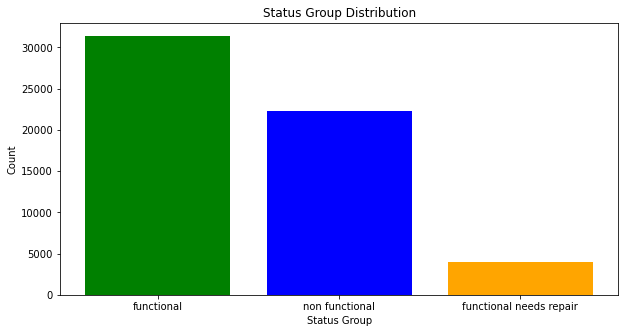

'Functional water pumps have the highest distribution followed closely by non_functional waterpumps'

In [71]:
# distribution of status groups
status_group_count = training_set_data.status_group.value_counts()
labels = list(status_group_count.index)
counts = list(status_group_count.tolist())

# plot
plt.figure(figsize=(10, 5)) 
plt.bar(labels, counts, color=['green', 'blue', 'orange']) 
plt.title('Status Group Distribution')
plt.xlabel('Status Group')
plt.ylabel('Count')


plt.show()

"""Functional water pumps have the highest distribution followed closely by non_functional waterpumps"""


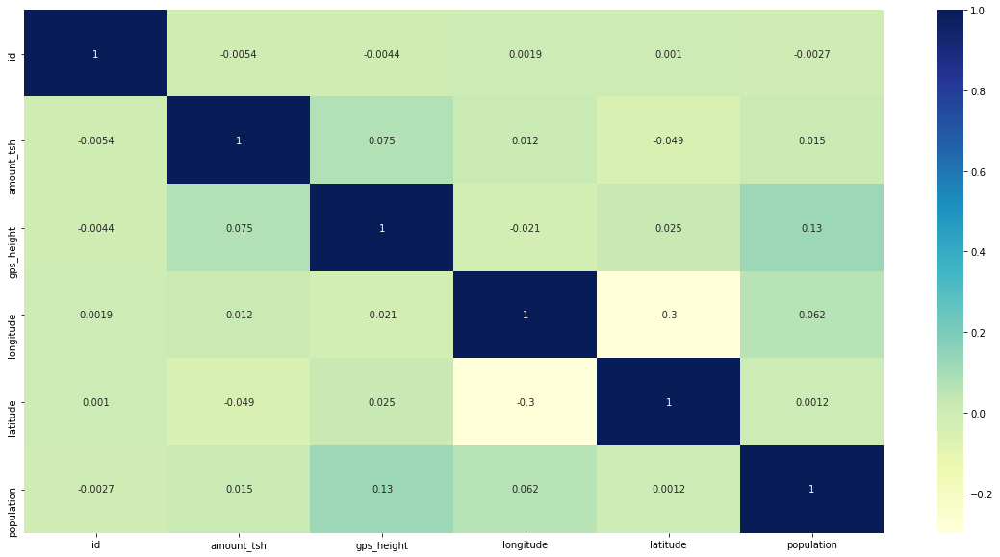

In [72]:
# Checking Correlation
plt.figure(figsize = (20, 10))
var = training_set_data.corr()
sns.heatmap(var, annot = True, cmap = "YlGnBu");

In [73]:
training_set_data.corr()

,id,amount_tsh,gps_height,longitude,latitude,population
id,1.000000,-0.005361,-0.004436,0.001930,0.001014,-0.002707
amount_tsh,-0.005361,1.000000,0.074547,0.012364,-0.049216,0.015052
gps_height,-0.004436,0.074547,1.000000,-0.021465,0.024868,0.125560
longitude,0.001930,0.012364,-0.021465,1.000000,-0.298460,0.062275
latitude,0.001014,-0.049216,0.024868,-0.298460,1.000000,0.001178
population,-0.002707,0.015052,0.125560,0.062275,0.001178,1.000000


There is moderate and weak correlation between my features therefore there is no multicolinearity with my data

### Check is there is an association between status group and the categorical values using a chi2 test

Our null hypothesis is that there is no effect of the categorical values on status group

In [74]:
from scipy.stats import chi2_contingency
categorical_values  = training_set_data.select_dtypes(include = ['object'])
for column in categorical_values:
    contingency_table = pd.crosstab(training_set_data[column], training_set_data['status_group'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi-squared test for {column}:  p-value: {p}")


Chi-squared test for status_group:  p-value: 0.0
Chi-squared test for funder:  p-value: 0.0
Chi-squared test for installer:  p-value: 0.0
Chi-squared test for basin:  p-value: 0.0
Chi-squared test for region:  p-value: 0.0
Chi-squared test for lga:  p-value: 0.0
Chi-squared test for ward:  p-value: 0.0
Chi-squared test for public_meeting:  p-value: 3.934142564294072e-80
Chi-squared test for permit:  p-value: 5.7392955746140146e-36
Chi-squared test for extraction_type:  p-value: 0.0
Chi-squared test for management:  p-value: 0.0
Chi-squared test for payment:  p-value: 0.0
Chi-squared test for water_quality:  p-value: 0.0
Chi-squared test for quantity:  p-value: 0.0
Chi-squared test for source:  p-value: 0.0
Chi-squared test for waterpoint_type:  p-value: 0.0


A p_value of 0 suggests that there is strong evidence to reject our null hypothesis. Therefore there is a strong evidence to suggest  relationship between status group, which is our target variable and the categorical values being tested.

Public meeting and permit also have a p_value that is close to 0, suggesting a strong relationship with status_group.

### check for association of status group with numerical features

In [75]:
from scipy.stats import kruskal

numeric_values = training_set_data.select_dtypes(exclude = ['object'])
for column in numeric_values:
    values = [training_set_data[column][training_set_data['status_group'] == category] for category in training_set_data['status_group'].unique()]
    h_statistic, p_value = kruskal(*values)
    print(f"Kruskal-Wallis test for {column}: p-value = {p_value}")

Kruskal-Wallis test for id: p-value = 0.5728478746582422
Kruskal-Wallis test for amount_tsh: p-value = 0.0
Kruskal-Wallis test for gps_height: p-value = 1.515832150152648e-135
Kruskal-Wallis test for longitude: p-value = 5.583733221489433e-74
Kruskal-Wallis test for latitude: p-value = 1.3661697435555963e-09
Kruskal-Wallis test for population: p-value = 5.551093226714186e-12


These small p-values indicate that there is very strong evidence of a significant relationship between the numerical variables and the 'status_group' categorical variable, making them important predictors for our analysis or modeling.

The p_value of id is not important because ID is just an identifier of the wells, and each well has its own special ID number. So we will not drop that column

### Distribution of functionality of pumps in the country.

In [76]:
# Import packages
import folium
from folium.plugins import FloatImage

In [77]:
def folium_map(training_set_data, url):
    # Create 3 dataframes for each status_group
    df_f = training_set_data[training_set_data['status_group'] == 'functional']
    df_nf = training_set_data[training_set_data['status_group'] == 'non functional']
    df_fnr = training_set_data[training_set_data['status_group'] == 'functional needs repair']
    
    # Create lists of latitude and longitude values
    lat_f = [x for x in df_f['latitude']]
    long_f = [x for x in df_f['longitude']]

    lat_nf = [x for x in df_nf['latitude']]
    long_nf = [x for x in df_nf['longitude']]

    lat_fnr = [x for x in df_fnr['latitude']]
    long_fnr = [x for x in df_fnr['longitude']]

    lat_long_f = [(lat_f[i], long_f[i]) for i in range(len(lat_f))]
    lat_long_nf = [(lat_nf[i], long_nf[i]) for i in range(len(lat_nf))]
    lat_long_fnr = [(lat_fnr[i], long_fnr[i]) for i in range(len(lat_fnr))]
    
    # Create map for all locations
    this_map = folium.Map()

    # Loop through 3 dataframes and plot points for each coordinate with labels
    for coord in lat_long_nf[::5]:
        folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='orange', 
                            radius=1, fill_color='orange', fill_opacity=0.6, 
                            fill=True, tooltip='non functional').add_to(this_map)
    for coord in lat_long_f[::5]:
        folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='blue', 
                            radius=1, fill_color='blue', fill_opacity=0.6, 
                            fill=True, tooltip='functional').add_to(this_map)
    for coord in lat_long_fnr[::5]:
        folium.CircleMarker(location=[coord[0], coord[1]], opacity=0.6, color='green', 
                            radius=1, fill_color='green', fill_opacity=0.6, 
                            fill=True, tooltip='functional needs repair').add_to(this_map) 

    # Set the zoom to fit our bounds
    this_map.fit_bounds(this_map.get_bounds())

    # Add a custom legend
    legend_html = """
    <div style="position: fixed; 
                 bottom: 50px; left: 50px; width: 200px; height: 100px; 
                 background-color: white;
                 border:2px solid grey; z-index:9999; font-size:14px;
                 ">&nbsp; Legend <br>
                 &nbsp; <i class="fa fa-circle" style="color:orange"></i> Non Functional &nbsp; <br>
                 &nbsp; <i class="fa fa-circle" style="color:blue"></i> Functional &nbsp; <br>
                 &nbsp; <i class="fa fa-circle" style="color:green"></i> Functional Needs Repair &nbsp;
    </div>
    """

    this_map.get_root().html.add_child(folium.Element(legend_html))

    # Save the map
    this_map.save(url)
    return this_map

# Call the function
folium_map(training_set_data, 'images/distribution_of_total_wells_in_tz.html')

From the observations made from the map. Songwe,chunya,mpimbwe and sikonge areas have very few that have been erected and the ones that are available are mostly not functional.

Lindi , mtwara , machingwa and nanyumbun areas have a very high number of non functional wells.

### Check if there is an effect of the installers on the status of the the functionality of the wells.

In [78]:
# Create a contingency table
contingency_table = pd.crosstab(index=training_set_data['installer'],
                                columns=[ training_set_data['status_group']],
                                rownames=['installer'],
                                colnames=['well_status'])


chi2, p, _, _ = chi2_contingency(contingency_table)

# Check the p-value to determine if there is a significant relationship
if p < 0.05:
    print("There is a relationship between installer and well functionality.")
else:
    print("There is no relationship betweenregion, installer and well functionality.")

There is a relationship between installer and well functionality.


From the observed results, we can see that the installers engaged for a specific project significantly had an effect on the  performance  of the wells. That suggests that installer credibility and the standards and quality in which they handled the well installations could have a very big effect on the functionality of the wells.

### Distribution of status group on continous features.

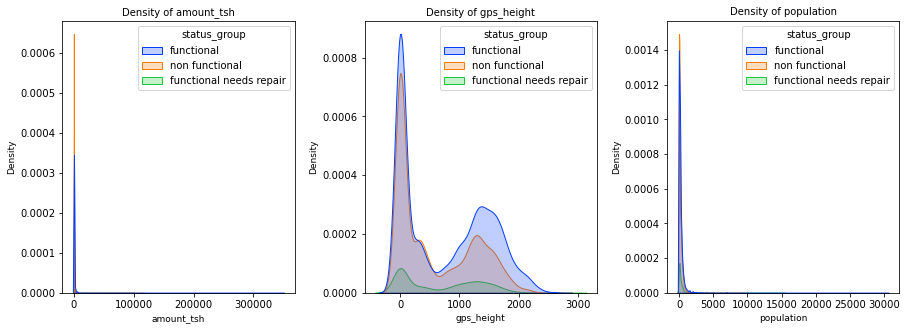

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of continuous variables
continuous = ['amount_tsh', 'gps_height', 'population']

# Set up the subplots with 1 row and 3 columns
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
fig.subplots_adjust(wspace=0.3)  # Increase horizontal spacing

# Create density (KDE) plots for continuous variables
for i, column in enumerate(continuous):
    sns.kdeplot(data=training_set_data, x=column, hue='status_group', palette='bright', fill=True, ax=axes[i])
    axes[i].set_title(f'Density of {column}', fontsize=10)
    axes[i].set_xlabel(column, fontsize=9)
    axes[i].set_ylabel('Density', fontsize=9)

# Save the figure as an image
plt.savefig('images/density_of_target_class_vs_continuous_features.jpg')

# Display the plot
plt.show()

From our observation we see that amount ts and population had a high number of non functional wells.

In total static head , static heads with 0 had an equal distribution in non functional and functional wells.

For gps_height, There was a high number of functional wells. Another thing to note us that wells with an altitude of 3000 and upwards all needed repair.

Areas with a population of 0 had very high number of non functional wells.

### Status group distribution on categorical variables

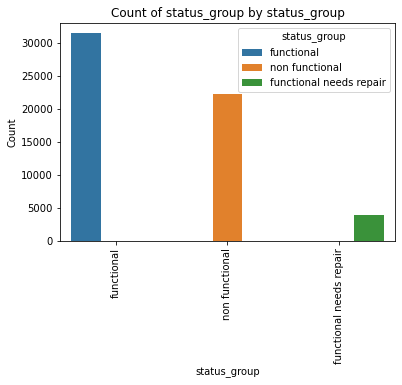

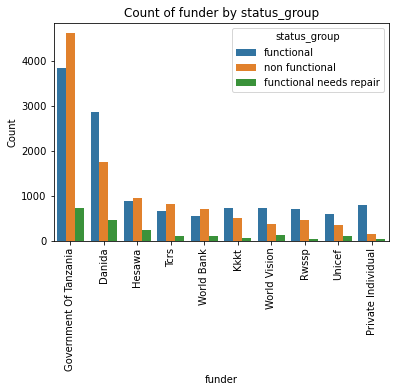

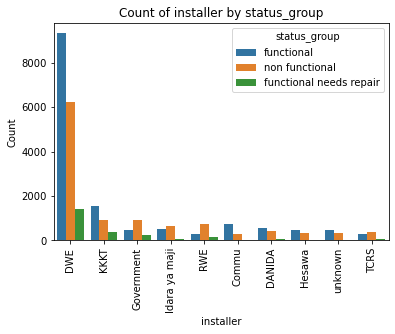

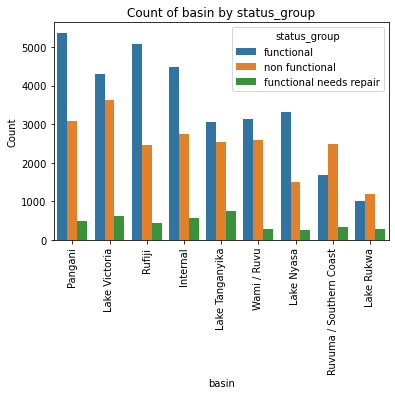

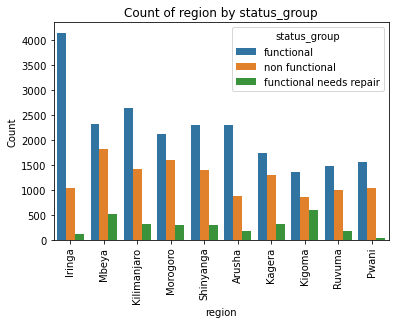

...

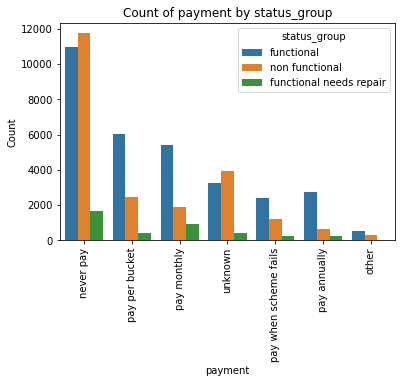

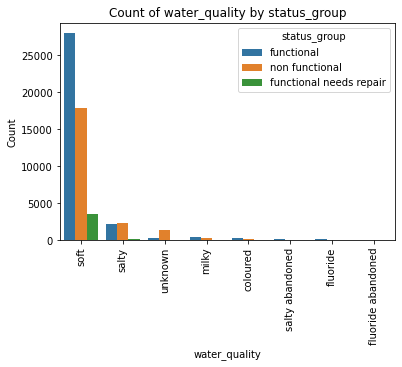

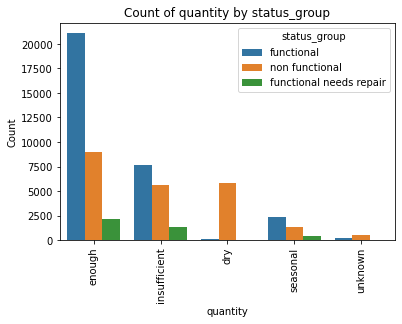

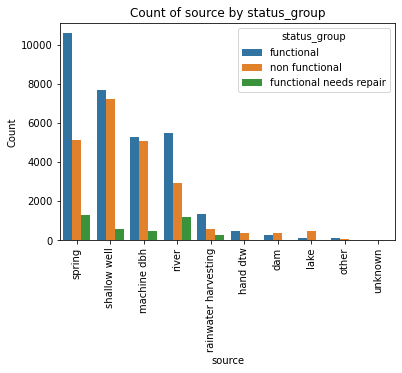

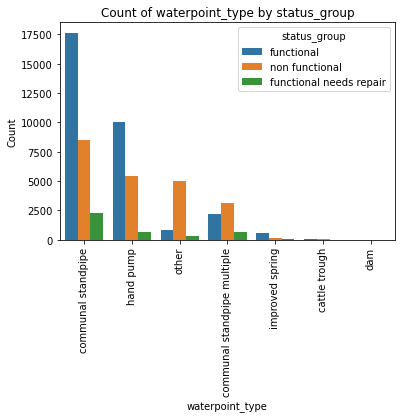

In [80]:
categorical_values = training_set_data.select_dtypes(include = ['object'])
status_column = 'status_group'
categories_to_show = 10
for column in categorical_values:
    sns.countplot(data=training_set_data, x=column, hue=status_column, order=training_set_data[column].value_counts().index[:categories_to_show])
    plt.title(f'Count of {column} by {status_column}')
    plt.xticks(rotation=90)
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.legend(title=status_column, loc='upper right') 
    plt.show()

There is an imbalance with the functional needs repair wells having the least number of wells.

The Goverment of Tanzania being the biggest funger of the wells projects has the highest number of non functional wells with close to 5000 non functional wells. It also has the highest number of functional wells with over 3500 functional wells.

PWE installer has the most installs. It has over 6000 non functional installations and close to 9000 functional installations. The goverment,Idara ya Maji , RWE  and TCRS installers have more non functional installations than functional installations.

Lake Victoria basin has the highest count of non functional wells with close to 4000 non functional wells. Pangani basin has the highest number of functional wells with over 5000 functional wells.

Igosi ward has the highest number of functional wells with approximatley 300 functional wells. Mishomo ward has the highest count of non functional wells with approximatley 160.

Most wells have been installed in public meeting places.

Most installations had permits.

Most wells extract water using gravity. The rope pump is the least used method of extraction.

VWC has the most wells under its managment.

Most wells provide water for free.

Most wells have soft water.

Spring water wells are the most type of wells.

Most wells are communual stand pipe wells. The least are dams.





## MODELLING

In [81]:
#import necessary libraries
import  category_encoders as ce
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay
from xgboost import XGBClassifier

encoding our categorical features

In [82]:
"""encoding my categorical data using Binary Encoding"""

# Create a copy of the target variable
target_variable = training_set_data['status_group'].copy()
#create a copy of the categorical columns
original_categorical_columns = training_set_data.select_dtypes(include=['object']).drop(['status_group'], axis=1).copy()

#categorical columns to be encoded
categorical_columns = training_set_data.select_dtypes(include= ['object']).drop(['status_group'] , axis = 1).columns

#  instantiate encoder
binary_encoder = ce.BinaryEncoder(cols=categorical_columns)

# Fit and transform the identified categorical columns
data_encoded = binary_encoder.fit_transform(training_set_data[categorical_columns])

# drop original columns and add the encoded ones
training_set_data.drop(columns=categorical_columns, inplace=True)
training_set_data = pd.concat([training_set_data, data_encoded], axis=1)


splitting our data

In [83]:
X = training_set_data.drop(['status_group'], axis=1)
y = training_set_data['status_group']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# information about train and test set 
print(" X_train dataset: ", X_train.shape) 
print("y_train dataset: ", y_train.shape) 
print(" X_test dataset: ", X_test.shape) 
print(" y_test dataset: ", y_test.shape) 

 X_train dataset:  (46070, 86)
y_train dataset:  (46070,)
 X_test dataset:  (11518, 86)
 y_test dataset:  (11518,)


scaling

In [84]:
scaler = StandardScaler()  # instantiate
X_train_scaled = scaler.fit_transform(X_train) # fit and transform my train data

# Transform the test data 
X_test_scaled = scaler.transform(X_test)

handling imbalances

In [85]:
#Apply SMOTE to the training data 
sm = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = sm.fit_resample(X_train_scaled, y_train)

## FIRST MODEL

Using random forest classifier

In [86]:
from sklearn.ensemble import RandomForestClassifier
#create a random forest classifier
rf_classifier = RandomForestClassifier(random_state=42 )

#fit the model
rf_classifier.fit (X_train_resampled , y_train_resampled)

#make predictions
y_predict = rf_classifier.predict(X_test_scaled)

#evaluate the accuracy
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))


[[5316  312  650]
 [ 317  339  130]
 [ 859  109 3486]]
                         precision    recall  f1-score   support

             functional       0.82      0.85      0.83      6278
functional needs repair       0.45      0.43      0.44       786
         non functional       0.82      0.78      0.80      4454

               accuracy                           0.79     11518
              macro avg       0.69      0.69      0.69     11518
           weighted avg       0.79      0.79      0.79     11518



The first row represents instances that are in the functional class, the second row represents instances that are in the functional needs repair class and the third row represents instances that are in the not functional class
                        
> <span style="color: blue">Functional</span>

The model correctly predicted 5316 instances as functional. It wrongly predicted 312 instances as functional needs repair when in real sense they were functional and also wrongly predicts 650 instances as non functional while they were actually functional

> <span style="color: blue">Functional Needs Repair</span>

The model correctly predicts 339 instances as functional needs repair. It wrongly predicted 317 instances as functional when in real sense they needed repair and also wrongly precicted 130 instances as not functional when they needed repair

> <span style="color: blue">Non_Functional</span>

The model correctly predicts 3486 instances  as not functional. However it wrongly predicted 859 instances as functional when they were not functional and also wrongly predicted 109 instances as needs repair when they were not functional.

> <span style="color: blue">Precision</span>

It measures the proportion of all predictions that were correct.
Theres an 82% precision for the functional wells , a 45% precision for the functional needs repair wells and a 82% precision for the not functional wells.

> <span style="color: blue">Recall</span>

Measures the proportion of actual positive cases that were correctly identified
85% of positive instances in the functional status group were correctly predicted  43% in the functional needs repair were predicted and 78% in the not functional status group were predicted

> <span style="color: blue">F1_Score</span>

This is the harmonic mean of precision and recall 
Functional had a score of 83% , functional needs repair had a score of 44% and non functional 80%

> <span style="color: blue">Support</span>

This is the number of instances in each of your class

> <span style="color: blue">Accuracy</span>

Measures the overall correctness of the model's predictions. Our model has an accuracy of 79%

Since we have alot of class imbalance, we will make use of ROC. It quantifies how well the model distinguishes between the two classes by measuring the area under the ROC curve (AUC-ROC).

In [87]:
from sklearn.metrics import roc_auc_score

rf_predictions = rf_classifier.predict_proba(X_test_scaled)  

roc_auc = roc_auc_score(y_test,rf_predictions, multi_class='ovr', average='weighted')
print(f"AUC-ROC (OvR): {roc_auc:.2f}")

AUC-ROC (OvR): 0.90


Measure the mcc. This is a metric used to evaluate the performance of binary classification models, particularly when dealing with imbalanced datasets. It takes into account true positives, true negatives, false positives, and false negatives to provide a balanced measure of classification performance.

In [88]:
from sklearn.metrics import matthews_corrcoef
mcc = matthews_corrcoef(y_test, y_predict)

print("MCC:", mcc)

MCC: 0.6217414363151533


An roc of 90 suggests that the model has a strong ability to distinguish between positive and negative instances.
An MCC of 0.62 suggests a strong positive correlation between predicted and true classifications.

However the predictions in my functional needs repair class are performinng poorly. we shall make use of another model to see if there will be any improvements

##  SECOND MODEL
Using logistic regression


In [89]:
from sklearn.linear_model import LogisticRegression

# Create a model
logistic_model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42)

# Fit the model 
logistic_model.fit(X_train_resampled, y_train_resampled)

# Make predictions 
logistic_y_pred = logistic_model.predict(X_test_scaled)

#evaluate performance
print(classification_report(y_test, logistic_y_pred))
print(confusion_matrix(y_test, logistic_y_pred))

                         precision    recall  f1-score   support

             functional       0.76      0.61      0.67      6278
functional needs repair       0.16      0.59      0.25       786
         non functional       0.75      0.60      0.66      4454

               accuracy                           0.60     11518
              macro avg       0.56      0.60      0.53     11518
           weighted avg       0.71      0.60      0.64     11518

[[3809 1706  763]
 [ 201  467  118]
 [1010  787 2657]]


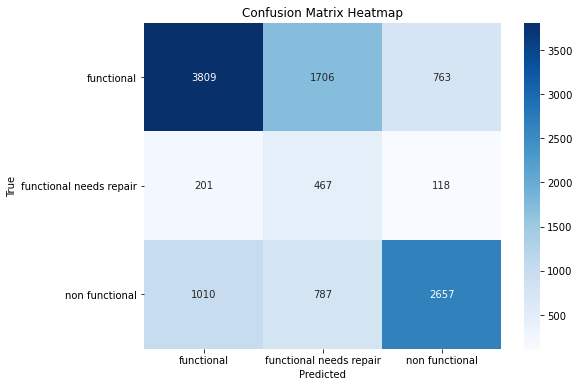

In [91]:
# confusion matrix
confusion_matrix = [[3809, 1706,  763],
                    [ 201 , 467 , 118],
                    [1010 , 787 ,2657]]

# class labels
class_labels = ['functional', 'functional needs repair', 'non functional']

# confusion matrix heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)

#labels
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix Heatmap')
plt.show()

The accuracy is 60% which is significantly lower than for the first model which was 79%.


For the **Functional** class , the second model has a **recall** (0.61) which is smaller to the first models, a lower **precision** (0.76) and a lower **f1_score** of (0.67) compared to the first model's.

For the **Functional Needs Repair** class, the second model has a lower **recall** (0.59) compared to the first model's  a  smaller **precision** of (0.16). The **f_1 score** is smaller at (0.25).

For the **Non-Functional** class, the seconds model's **precision** (0.75) is somewhat lower in comparison to that of the first model's  and its **recall** (0.60) is marginally lower than that of the first model. The **f_1 score** of the second model is lower(0.66) than that of the first 


In [92]:
rf_predictions = logistic_model.predict_proba(X_test_scaled)  

roc_auc = roc_auc_score(y_test,rf_predictions, multi_class='ovr', average='weighted')
print(f"AUC-ROC (OvR): {roc_auc:.2f}")

AUC-ROC (OvR): 0.80


The roc of the second model is lower compared to the first which is an indication that the first model performs better than the second model.

Despite fixing class imbalances using SMOTE , the quantity of support for each class in the resampled data may still be affected because SMOTE creates sample instances using data that is already in existence. In this case, the functional needs repair class had significantly less instances compared to other classes.

Precision focuses on minimizing false positives, while recall focuses on minimizing false negatives therefore Improving precision may lead to a decrease in recall and vice versa as seen in our models above

## MODEL 3
Using gradient Boost Classifier

In [93]:
from sklearn.ensemble import GradientBoostingClassifier

# Gradient Boosting Classifier
gb_classifier = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit model on  scaled training data
gb_classifier.fit(X_train_resampled, y_train_resampled)

# Make predictions on scaled test set
gb_y_pred = gb_classifier.predict(X_test_scaled)

# evaluate performance
print(classification_report(y_test, gb_y_pred))

                         precision    recall  f1-score   support

             functional       0.75      0.79      0.77      6278
functional needs repair       0.27      0.39      0.32       786
         non functional       0.78      0.65      0.71      4454

               accuracy                           0.71     11518
              macro avg       0.60      0.61      0.60     11518
           weighted avg       0.73      0.71      0.72     11518



In [94]:
rf_predictions = gb_classifier.predict_proba(X_test_scaled)  

roc_auc = roc_auc_score(y_test,rf_predictions, multi_class='ovr', average='weighted')
print(f"AUC-ROC (OvR): {roc_auc:.2f}")

AUC-ROC (OvR): 0.83


From our observation of the metric scores, our model performs better than the second model.

## MODEL 4
Using xgboost classifier

In [95]:
xgb_classifier = XGBClassifier(random_state=42)

# Train model
xgb_classifier.fit(X_train_resampled , y_train_resampled)

# Make predictions
xgb_y_predict = xgb_classifier.predict(X_test_scaled)

# Evaluate the model
accuracy_xgb = accuracy_score(y_test, xgb_y_predict)

print(classification_report(y_test, xgb_y_predict))

                         precision    recall  f1-score   support

             functional       0.79      0.85      0.82      6278
functional needs repair       0.40      0.42      0.41       786
         non functional       0.83      0.74      0.78      4454

               accuracy                           0.78     11518
              macro avg       0.67      0.67      0.67     11518
           weighted avg       0.78      0.78      0.78     11518



In [96]:
rf_predictions = xgb_classifier.predict_proba(X_test_scaled)  

roc_auc = roc_auc_score(y_test,rf_predictions, multi_class='ovr', average='weighted')
print(f"AUC-ROC (OvR): {roc_auc:.2f}")

AUC-ROC (OvR): 0.89


Our 4th model performs better than our second and third model

## MODEL 5
Using PCA. ( Principal Component Analysis.)

In [97]:
from sklearn.decomposition import PCA
# threshold
k_components = 0.95 
pca = PCA(n_components=k_components)

#fit model
X_train_pca = pca.fit_transform(X_train_resampled)

#transform test data
X_test_pca = pca.transform(X_test_scaled)

# Create Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Fit the model on transformed data
rf_classifier.fit(X_train_pca, y_train_resampled)

# make predictions on x_test_pca
y_predict_pca = rf_classifier.predict(X_test_pca)

# Evaluate  accuracy
print(classification_report(y_test, y_predict_pca))

                         precision    recall  f1-score   support

             functional       0.80      0.79      0.79      6278
functional needs repair       0.36      0.41      0.39       786
         non functional       0.76      0.75      0.76      4454

               accuracy                           0.75     11518
              macro avg       0.64      0.65      0.65     11518
           weighted avg       0.75      0.75      0.75     11518



The model performs better than the third and second model but does not outperform the fourth model whose accuracy is 0.78 compared to the 5th models 0.75.

## MODEL 6
As previously mentioned, the primary objective is to reduce false negatives for the "non-functional" and "functional needs repair" classes while increasing their value. We may accomplish this by allocating higher weight to these classes. This will help to emphasise them during training and reduce false negatives. 

In [98]:
# Create a Random Forest Classifier model with class weights
class_weights = {'functional': 1, 'functional needs repair': 2, 'non functional': 3}
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, class_weight=class_weights)

# Fit model on the scaled training data
rf_classifier.fit(X_train_resampled, y_train_resampled)

# Make predictions 
rf_y_pred = rf_classifier.predict(X_test_scaled)

# evaluate accuracy
print(classification_report(y_test, rf_y_pred))

                         precision    recall  f1-score   support

             functional       0.82      0.85      0.83      6278
functional needs repair       0.44      0.43      0.43       786
         non functional       0.82      0.78      0.80      4454

               accuracy                           0.79     11518
              macro avg       0.69      0.68      0.69     11518
           weighted avg       0.79      0.79      0.79     11518



The weighted model has the same accuracy as the unweighted rf classifier model. Balancing the class weights does not imporive the models performance in any way.


## MODEL 7

Combining my top 3 performing models to improve my performance through ensambling

In [99]:
from sklearn.ensemble import VotingClassifier

rf_classifier = RandomForestClassifier(random_state=42)
xgb_classifier = XGBClassifier(random_state=42)
pca_rf_classifier = RandomForestClassifier(random_state=42)

# train models
rf_classifier.fit(X_train_resampled, y_train_resampled)
xgb_classifier.fit(X_train_resampled, y_train_resampled)
pca_rf_classifier.fit(X_train_pca, y_train_resampled)

# Voting Classifier 
voting_classifier = VotingClassifier(estimators=[
    ('RandomForest', rf_classifier),
    ('XGBoost', xgb_classifier),
    ('PCA_RandomForest', pca_rf_classifier)
], voting='soft')

# fit classifier
voting_classifier.fit(X_train_resampled, y_train_resampled)

# predict
y_predict_voting = voting_classifier.predict(X_test_scaled)

# evaluate
print(classification_report(y_test, y_predict_voting))

                         precision    recall  f1-score   support

             functional       0.82      0.86      0.84      6278
functional needs repair       0.45      0.42      0.43       786
         non functional       0.83      0.78      0.81      4454

               accuracy                           0.80     11518
              macro avg       0.70      0.69      0.69     11518
           weighted avg       0.80      0.80      0.80     11518



In [100]:
rf_predictions = voting_classifier.predict_proba(X_test_scaled)  

roc_auc = roc_auc_score(y_test,rf_predictions, multi_class='ovr', average='weighted')
print(f"AUC-ROC (OvR): {roc_auc:.2f}")

AUC-ROC (OvR): 0.91


These combined model has the best predictions from all of my models

Model 7, created through ensabling is the best performing model out of our 7 models with an accuracy of 80.

The accuracy is higher at 80%
And the precision and recall scores are also higher in this model
The ROC is also higher at 0.91


The overall performance of this model is better than the previously best performing model therefore we are going to make use of this model for our predictions.

SAVING MY MODEL

In [104]:
import joblib

# Save the trained model to a file
joblib.dump(voting_classifier, 'voting_classifier_model.pkl')

['voting_classifier_model.pkl']

#### CHALLANGES FACED DURING MODELLING

> <span style="color: blue">1. Class Imbalances</span>

Challanges faced during modelling were class imbalances which greatly affected the scores of the functional needs repair class as observerd

> <span style="color: blue">2. Missing Information</span>

Missing information which made the cleaning process very tedious

> <span style="color: blue">3. Undefined Categories</span>

There were alot of undefined categories which had to be stored in the 'other' and 'unknown' placeholders

#### FURTHER DIRECTIONS

> <span style="color: blue">1. Modelling</span>

Experiment with more models.

> <span style="color: blue">2. Tuning</span>

It's possible that more fine tuning of models could bring more accuracy.

> <span style="color: blue">3. Feature engineering</span>

More research could possibly bring up more features to add to the dataset or manipulation of certain features in the dataset to bring out more meaningful features.

> <span style="color: blue">3. Data Collection</span>

 Better data collection and documentation


**Plot my features ranking them according to their importance using my random forest classifier**

## MODEL PREDICTIONS ON MY TEST DATA 

Making use of my test_data. The test data has been cleaned following the same exact steps used in my training data set and the workings are in the
cleaned_test_set_data.ipynb notebook

In [113]:
# load the clean test set data
test_set_data = pd.read_csv('clean_test_set_data.csv')
test_set_data.drop(columns = 'Unnamed: 0' , inplace = True)
test_set_data.head(5)

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,region,region_code,...,public_meeting,permit,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type,region_encoded
0,50785,0.0,Dmdd,1996,DMDD,35.290799,-4.059696,Internal,Manyara,21,...,True,True,other,parastatal,never pay,soft,seasonal,rainwater harvesting,other,8
1,51630,0.0,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Pangani,Arusha,2,...,True,True,gravity,vwc,never pay,soft,insufficient,spring,communal standpipe,0
2,17168,0.0,Tcrs,1567,SEMA,34.767863,-5.004344,Internal,Singida,13,...,True,unknown,other,vwc,never pay,soft,insufficient,rainwater harvesting,other,18
3,45559,0.0,Finn Water,267,FINN WATER,38.058046,-9.418672,Ruvuma / Southern Coast,Lindi,80,...,unknown,True,other,vwc,unknown,soft,dry,shallow well,other,7
4,49871,500.0,Bruder,1260,BRUDER,35.006123,-10.950412,Ruvuma / Southern Coast,Ruvuma,10,...,unknown,True,gravity,water board,pay monthly,soft,enough,spring,communal standpipe,16


In [114]:
# check length of columns
len(test_set_data.columns)

23

In [117]:
test_set_data.drop('region_encoded' , axis = 1 , inplace = True)

In [119]:
test_set_data.drop('region_code' , axis = 1 , inplace = True)

In [120]:
# Extract the categorical columns in the test data
categorical_columns_test = test_set_data.select_dtypes(include=['object'])

# Use the same encoder used in the train set  to transform the categorical columns in the test data
test_encoded =binary_encoder.transform(categorical_columns_test)

In [121]:
# Drop the original categorical columns in the test data
test_set_data.drop(columns=categorical_columns_test.columns, inplace=True)

# Concatenate the encoded test data with the original test data
test_set_data = pd.concat([test_set_data, test_encoded], axis=1)

In [122]:
# confirm the shape is similar to train set
test_set_data.shape

(14850, 86)

In [124]:
# scale our test data using the same scaler used on our train set data
X_test_encoded_scaled = scaler.transform(test_set_data)

In [125]:
# load our model (Voting classifier model that was the best peforming)
voting_classifier = joblib.load('voting_classifier_model.pkl')

# Use model to make predictions on test data
y_predict_voting = voting_classifier.predict(X_test_encoded_scaled)

In [126]:
# closer view of predict_voting
y_predict_voting

array(['non functional', 'functional needs repair', 'non functional', ...,
       'functional', 'functional', 'non functional'], dtype=object)

In [129]:
import numpy as np
# Make a copy of y predict voting
y_pred_copy = np.copy(y_predict_voting)

In [130]:
# convert to data frame
y_predictions_df = pd.DataFrame({'Predicted_Labels': y_predict_voting})


In [131]:
# convert predictions to a csv file
y_predictions_df.to_csv('predictions.csv')

In [132]:
# load predicts csv file
status_group_predictions = pd.read_csv('predictions.csv')

In [133]:
# view predictions
status_group_predictions.head(5)

,Unnamed: 0,Predicted_Labels
0,0,non functional
1,1,functional needs repair
2,2,non functional
3,3,non functional
4,4,functional


In [134]:
# combined predictions to our scaled data
test_set_with_predictions = pd.concat([test_set_data, status_group_predictions], axis=1)

In [135]:
# load the cleaned test data
test = pd.read_csv('clean_test_set_data.csv')
test.drop(columns = 'Unnamed: 0' , inplace = True)
test.head(5)

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,region,region_code,...,public_meeting,permit,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type,region_encoded
0,50785,0.0,Dmdd,1996,DMDD,35.290799,-4.059696,Internal,Manyara,21,...,True,True,other,parastatal,never pay,soft,seasonal,rainwater harvesting,other,8
1,51630,0.0,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Pangani,Arusha,2,...,True,True,gravity,vwc,never pay,soft,insufficient,spring,communal standpipe,0
2,17168,0.0,Tcrs,1567,SEMA,34.767863,-5.004344,Internal,Singida,13,...,True,unknown,other,vwc,never pay,soft,insufficient,rainwater harvesting,other,18
3,45559,0.0,Finn Water,267,FINN WATER,38.058046,-9.418672,Ruvuma / Southern Coast,Lindi,80,...,unknown,True,other,vwc,unknown,soft,dry,shallow well,other,7
4,49871,500.0,Bruder,1260,BRUDER,35.006123,-10.950412,Ruvuma / Southern Coast,Ruvuma,10,...,unknown,True,gravity,water board,pay monthly,soft,enough,spring,communal standpipe,16


In [136]:
# combine predicted labels with the test data
predicted_test_set = pd.concat([test, status_group_predictions], axis=1)

In [137]:
# closer look at the compined test data
predicted_test_set.head()

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,region,region_code,...,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type,region_encoded,Unnamed: 0,Predicted_Labels
0,50785,0.0,Dmdd,1996,DMDD,35.290799,-4.059696,Internal,Manyara,21,...,other,parastatal,never pay,soft,seasonal,rainwater harvesting,other,8,0,non functional
1,51630,0.0,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Pangani,Arusha,2,...,gravity,vwc,never pay,soft,insufficient,spring,communal standpipe,0,1,functional needs repair
2,17168,0.0,Tcrs,1567,SEMA,34.767863,-5.004344,Internal,Singida,13,...,other,vwc,never pay,soft,insufficient,rainwater harvesting,other,18,2,non functional
3,45559,0.0,Finn Water,267,FINN WATER,38.058046,-9.418672,Ruvuma / Southern Coast,Lindi,80,...,other,vwc,unknown,soft,dry,shallow well,other,7,3,non functional
4,49871,500.0,Bruder,1260,BRUDER,35.006123,-10.950412,Ruvuma / Southern Coast,Ruvuma,10,...,gravity,water board,pay monthly,soft,enough,spring,communal standpipe,16,4,functional


In [138]:
# Save data frame to csv
predicted_test_set.to_csv('predicted_test_set.csv')

### ANALYSING THE PREDICTIONS MADE ON THE TEST DATA

In [139]:
# load data
predicted_test_set = pd.read_csv('predicted_test_set.csv' , index_col= 0)
predicted_test_set.sample(5)

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,region,region_code,...,extraction_type,management,payment,water_quality,quantity,source,waterpoint_type,region_encoded,Unnamed: 0.1,Predicted_Labels
1572,9994,60.0,unknown,60,unknown,39.095922,-7.035915e+00,Wami / Ruvu,Dar es Salaam,7,...,submersible,wug,pay per bucket,soft,enough,machine dbh,communal standpipe,1,1572,functional
10690,31189,0.0,Kkkt_makwale,0,KKKT _ Konde and DWE,34.009968,-9.462759e+00,Lake Nyasa,Mbeya,12,...,gravity,vwc,never pay,soft,enough,spring,communal standpipe,10,10690,functional
1105,47835,0.0,Dwsp,0,DWE,20.975217,-2.000000e-08,Lake Victoria,Shinyanga,17,...,nira/tanira,wug,never pay,soft,dry,shallow well,hand pump,17,1105,non functional
1491,73762,500.0,Plan Int,223,DWE,36.683597,-8.141242e+00,Rufiji,Morogoro,5,...,submersible,unknown,pay monthly,soft,insufficient,machine dbh,communal standpipe,11,1491,functional
963,22588,0.0,Government Of Tanzania,0,GOVER,35.869629,-6.408889e+00,Rufiji,Dodoma,1,...,mono,vwc,unknown,soft,dry,machine dbh,communal standpipe multiple,2,963,non functional


> <span style="color: green">Distribution of wells according to functionality</span>

In [140]:
predicted_test_set['Predicted_Labels'].value_counts()


functional                 8730
non functional             5363
functional needs repair     757
Name: Predicted_Labels, dtype: int64

From our observation, there are 8673 functional wells, 5380 non functional wells and 797 wells that needed repair

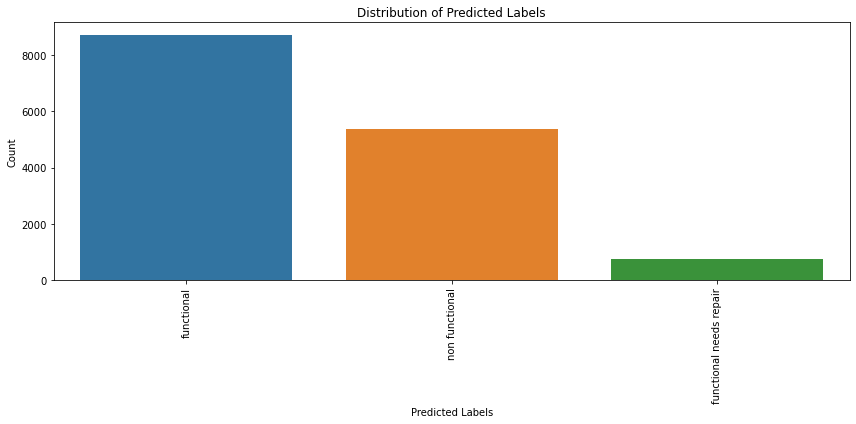

In [141]:
"""Visual representation"""

count = predicted_test_set['Predicted_Labels'].value_counts()

# Plot graph
plt.figure(figsize=(12, 6))
sns.barplot(x=count.index, y=count.values, order=count.index)
plt.xticks(rotation=90)

#label
plt.xlabel('Predicted Labels')
plt.ylabel('Count')
plt.title('Distribution of Predicted Labels')
plt.tight_layout()

# Show the plot
plt.show()

> <span style="color: green">Installer Vs Status Group</span>

See installers with the highest number of non functional wells

In [142]:
query7 = """SELECT installer, SUM(CASE WHEN Predicted_Labels = 'non functional' THEN 1 ELSE 0 END) AS non_functional_count
FROM predicted_test_set
GROUP BY installer
ORDER BY non_functional_count DESC
LIMIT 20 """ 

pysqldf = sqldf(query7)
result = pysqldf
result

,installer,non_functional_count
0,DWE,1537
1,Government,272
2,RWE,176
3,KKKT,160
4,SEMA,117
5,Central government,100
6,Commu,99
7,DANIDA,97
8,TCRS,94
9,Hesawa,93


In [143]:
# convert results to a data frame
result_df = pd.DataFrame(result)

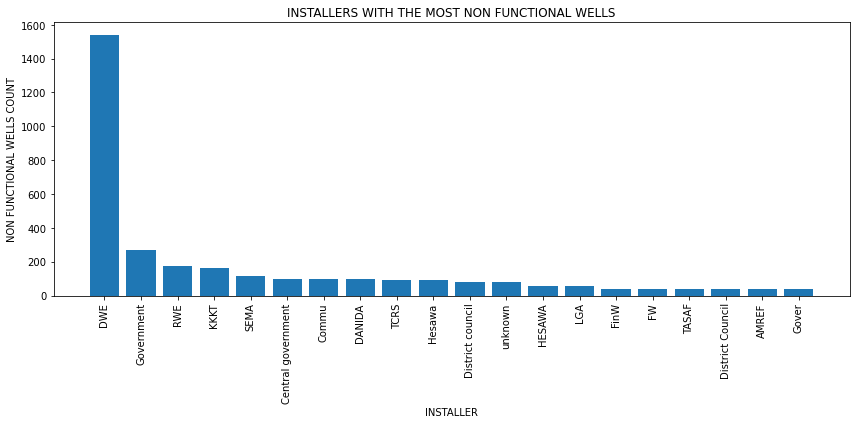

In [144]:
# visual representation of installers with the highest number of non functional wells
plt.figure(figsize=(12, 6))
plt.bar(result_df['installer'], result_df['non_functional_count'])
plt.xticks(rotation=90)
plt.xlabel('INSTALLER')
plt.ylabel('NON FUNCTIONAL WELLS COUNT')
plt.title('INSTALLERS WITH THE MOST NON FUNCTIONAL WELLS')
plt.tight_layout()

# Show the plot
plt.show()

Installers with the most functional wells

In [145]:
query8 = """SELECT installer, SUM(CASE WHEN Predicted_Labels = 'functional' THEN 1 ELSE 0 END) AS functional_count
FROM predicted_test_set
GROUP BY installer
ORDER BY functional_count DESC
LIMIT 20 """ 

pysqldf = sqldf(query8)
result1 = pysqldf
result1


,installer,functional_count
0,DWE,2743
1,KKKT,437
2,Commu,188
3,CES,151
4,Hesawa,143
5,SEMA,141
6,unknown,137
7,DANIDA,137
8,Government,116
9,DANID,110


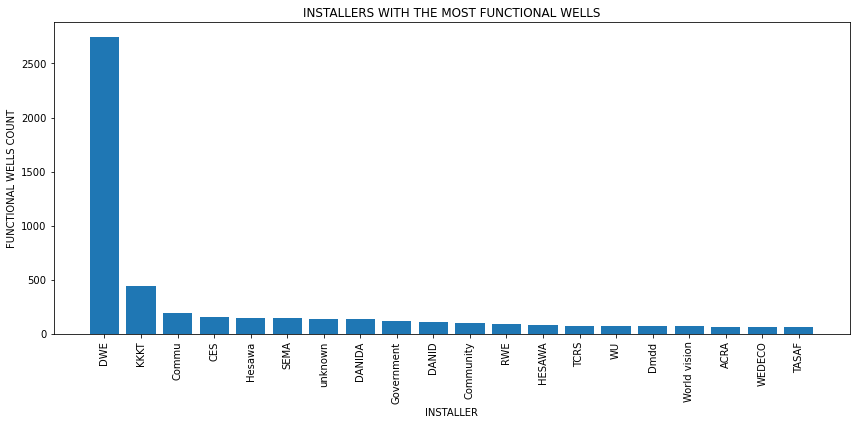

In [146]:
# visual representation of installers with the highest number of  functional wells
result1_df = pd.DataFrame(result1)
plt.figure(figsize=(12, 6))
plt.bar(result1_df['installer'], result1_df['functional_count'])
plt.xticks(rotation=90)
plt.xlabel('INSTALLER')
plt.ylabel('FUNCTIONAL WELLS COUNT')
plt.title('INSTALLERS WITH THE MOST FUNCTIONAL WELLS')
plt.tight_layout()

# Show the plot
plt.show()

**To analyse the effectivness of installers we see that ;**

1.Despite having the highest number of non_functional wells , DWE also has the highest number of functional wells.It is essential to investigate the causes of the high number of non-functional wells and consider improvements to installation and maintenance practices.

2.The Government installer has a relatively high number of non-functional wells (272) compared to their functional wells (116). 

3.RWE also has a relatively high number of non-functional wells (176) compared to functional ones (88). This indicates room for improvement in their well installations.

4.KKKT has a relatively high count of functional wells(437), compared to the non functional (160) which is relatively okay.

5.Hesawa has more functional wells(78) compared to the non-functional ones(57), suggesting their effectiveness in providing reliable water sources.


> <span style="color: green">Water quality vs status group</span>

Visual representation of water quality and functionality of wells

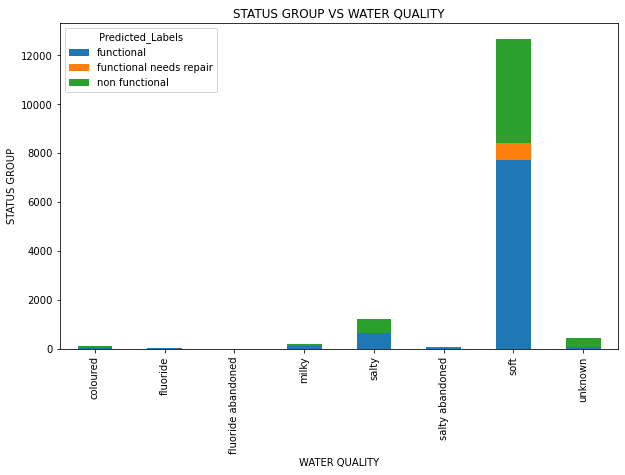

In [147]:
quality_df = predicted_test_set.groupby(['water_quality', 'Predicted_Labels']).size().unstack().fillna(0)

# Create a stacked bar graph
ax = quality_df.plot(kind='bar', stacked=True, figsize=(10, 6))

# Add labels and title
plt.xlabel('WATER QUALITY')
plt.ylabel('STATUS GROUP')
plt.title('STATUS GROUP VS WATER QUALITY')

# Show the plot
plt.show()



Most wells are soft water wells. Followed by salty water wells. Unknown wells, salty and salty abandoned are mostly non functional.

> <span style="color: green">Management Vs Status Group</span>

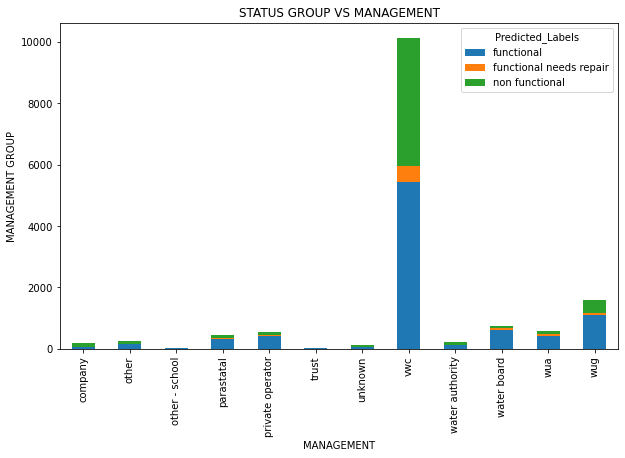

In [148]:
management_df = predicted_test_set.groupby(['management', 'Predicted_Labels']).size().unstack().fillna(0)

# Create a stacked bar graph
ax = management_df.plot(kind='bar', stacked=True, figsize=(10, 6))

# Add labels and title
plt.xlabel('MANAGEMENT')
plt.ylabel('MANAGEMENT GROUP')
plt.title('STATUS GROUP VS MANAGEMENT')

# Show the plot
plt.show()


VWC has the highest number of wells under its management followed by WUG. Trusts and schools have the lowest amount of wells under their management